### 1.Loading data and importing Libraries

In [152]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Choose a dataset with at least 20,000 observations
df = pd.read_csv("data/train_2v.csv")
df.head()


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,30669,Male,3.0,0,0,No,children,Rural,95.12,18.0,NaN,0
1,30468,Male,58.0,1,0,Yes,Private,Urban,87.96,39.2,never smoked,0
2,16523,Female,8.0,0,0,No,Private,Urban,110.89,17.6,NaN,0
3,56543,Female,70.0,0,0,Yes,Private,Rural,69.04,35.9,formerly smoked,0
4,46136,Male,14.0,0,0,No,Never_worked,Rural,161.28,19.1,NaN,0


### 2. Data Cleaning and Preprocessing

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43400 entries, 0 to 43399
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 43400 non-null  int64  
 1   gender             43400 non-null  object 
 2   age                43400 non-null  float64
 3   hypertension       43400 non-null  int64  
 4   heart_disease      43400 non-null  int64  
 5   ever_married       43400 non-null  object 
 6   work_type          43400 non-null  object 
 7   Residence_type     43400 non-null  object 
 8   avg_glucose_level  43400 non-null  float64
 9   bmi                41938 non-null  float64
 10  smoking_status     30108 non-null  object 
 11  stroke             43400 non-null  int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 4.0+ MB


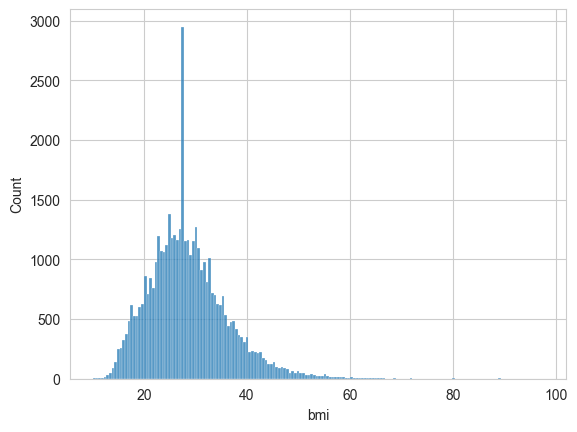

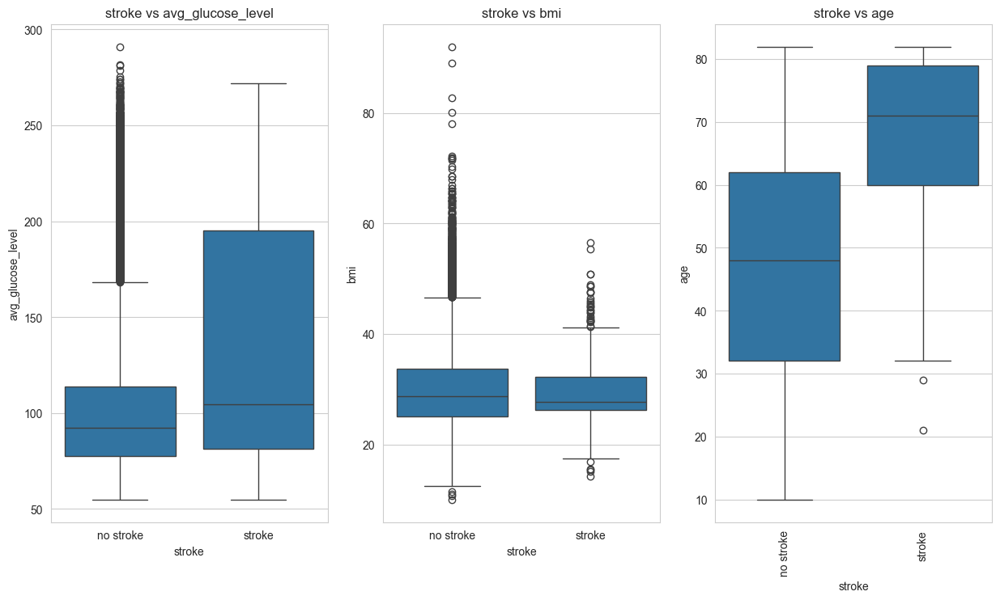

In [153]:
# Identification and Handling of Missing Values

# Perform initial exploration to understand the data structure, types of variables, and identify errors or missing values
df.info()

# Identify missing values
df.describe()

# Identifying and handling missing values
df.isnull().sum()

# Handle missing values by filling bmi with the median value
df['bmi'].fillna(df['bmi'].median(), inplace=True)
#there are outliers, as the median is not affected by them and better represents the "center" of the data.


# Checking the 'bmi' distributions
sns.histplot(df['bmi'])
plt.show()

# Fill missing 'bmi' based on the average per 'age' group
#df['bmi'] = df.groupby('age')['bmi'].transform(lambda x: x.fillna(x.mean()))

# Checking the 'bmi' distributions again
# sns.histplot(df['bmi'])
# plt.show()

# Smoking is a known risk factor for stroke. Remove patients with unknown smoking status as it could be a confounding factor in the analysis.
df.dropna(subset=['smoking_status'], inplace=True)

# Checking for children with stroke
df[(df['work_type'] == 'children') & (df['stroke'] == 1)]

# Error Correction and Inconsistencies
# Remove records with 'other' gender as they have no information
df = df[df['gender'].isin(['Female', 'Male'])]

# Correct binary columns
df['hypertension'] = df['hypertension'].apply(lambda x: 'no hypertension' if x == 0 else 'hypertension')
df['heart_disease'] = df['heart_disease'].apply(lambda x: 'no heart disease' if x == 0 else 'heart disease')
df['stroke'] = df['stroke'].apply(lambda x: 'no stroke' if x == 0 else 'stroke')

# Outliers Detection and Handling

# Detect and handle outliers in age, avg_glucose_level, and bmi
q10, q25, q50, q75 = df['age'].quantile([0.10, 0.25, 0.50, 0.75]).values
Iqr = q75 - q25
lf = int(q25 - 1.5 * Iqr)
uf = int(q75 + 1.5 * Iqr)
range_outlier_age = tuple([lf, uf])
df['age'].describe()

# No outliers in 'age' as all values are within (-10, 105)
out_age = df['age'][uf < df['age']]
out_age

# For 'avg_glucose_level' and 'bmi', high values are risk factors, so we keep the outliers
plt.figure(figsize=(15, 8))
numerical = ['avg_glucose_level', 'bmi', 'age']
for i, j in enumerate(numerical):
    plt.subplot(1, 3, i + 1)
    sns.boxplot(x=df['stroke'], y=df[j])
    plt.title(f'stroke vs {j}')
plt.xticks(rotation=90)
plt.show()


### 3. Data Types and Formatting

In [154]:
# Ensure correct data types and consistent formatting
df.info()

string_columns = ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'Residence_type', 'smoking_status', 'stroke']
for i in string_columns:
    df[i] = df[i].astype('string')

# Strip and lowercase all string columns
for i in string_columns:
    df[i] = df[i].str.strip().str.lower()

df.head()

# Feature Engineering

# Removing useless column 'id'
df.drop(['id'], inplace=True, axis=1)




<class 'pandas.core.frame.DataFrame'>
Index: 30099 entries, 1 to 43399
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 30099 non-null  int64  
 1   gender             30099 non-null  object 
 2   age                30099 non-null  float64
 3   hypertension       30099 non-null  object 
 4   heart_disease      30099 non-null  object 
 5   ever_married       30099 non-null  object 
 6   work_type          30099 non-null  object 
 7   Residence_type     30099 non-null  object 
 8   avg_glucose_level  30099 non-null  float64
 9   bmi                30099 non-null  float64
 10  smoking_status     30099 non-null  object 
 11  stroke             30099 non-null  object 
dtypes: float64(3), int64(1), object(8)
memory usage: 3.0+ MB


### 4. Feature Engieering

In [155]:

# Grouping by gender and stroke for basic statistics
counts_df = len(df)
result_2 = df.groupby(['gender', 'stroke']).agg(
    n=('gender', 'size'),
    percentage=('gender', lambda x: (x.size / counts_df) * 100),
    age_mean=('age', 'mean'),
    age_sd=('age', 'std')
).reset_index()
print(result_2)
df2 = df.copy()

# Create a new feature 'ever_smoked'
df['ever_smoked'] = df['smoking_status'].apply(lambda x: 'smoked' if x in ['smokes', 'formerly smoked'] else 'no smoked')
df2 = df.copy()
df



   gender     stroke      n  percentage   age_mean     age_sd
0  female  no stroke  18006   59.822585  46.888926  18.577887
1  female     stroke    360    1.196053  68.594444  12.214288
2    male  no stroke  11455   38.057743  48.458402  18.666693
3    male     stroke    278    0.923619  67.931655  11.359517


,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,ever_smoked
1,male,58.0,hypertension,no heart disease,yes,private,urban,87.96,39.2,never smoked,no stroke,no smoked
3,female,70.0,no hypertension,no heart disease,yes,private,rural,69.04,35.9,formerly smoked,no stroke,smoked
6,female,52.0,no hypertension,no heart disease,yes,private,urban,77.59,17.7,formerly smoked,no stroke,smoked
7,female,75.0,no hypertension,heart disease,yes,self-employed,rural,243.53,27.0,never smoked,no stroke,no smoked
8,female,32.0,no hypertension,no heart disease,yes,private,rural,77.67,32.3,smokes,no stroke,smoked
...,...,...,...,...,...,...,...,...,...,...,...,...
43395,female,10.0,no hypertension,no heart disease,no,children,urban,58.64,20.4,never smoked,no stroke,no smoked
43396,female,56.0,no hypertension,no heart disease,yes,govt_job,urban,213.61,55.4,formerly smoked,no stroke,smoked
43397,female,82.0,hypertension,no heart disease,yes,private,urban,91.94,28.9,formerly smoked,no stroke,smoked
43398,male,40.0,no hypertension,no heart disease,yes,private,urban,99.16,33.2,never smoked,no stroke,no smoked


### 5. Encoding of Categorical Variables


In [156]:
f2 = df.copy()

# Encode categorical variables using Label Encoding
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
columns = ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'Residence_type', 'smoking_status', 'ever_smoked', 'stroke']

for i in columns:
    df[i + '_encoded'] = le.fit_transform(df[i])

# Drop original categorical columns after encoding
for i in columns:
    df.drop([i], axis=1, inplace=True)

df.head()

,age,avg_glucose_level,bmi,gender_encoded,hypertension_encoded,heart_disease_encoded,ever_married_encoded,work_type_encoded,Residence_type_encoded,smoking_status_encoded,ever_smoked_encoded,stroke_encoded
1,58.0,87.96,39.2,1,0,1,1,3,1,1,0,0
3,70.0,69.04,35.9,0,1,1,1,3,0,0,1,0
6,52.0,77.59,17.7,0,1,1,1,3,1,0,1,0
7,75.0,243.53,27.0,0,1,0,1,4,0,1,0,0
8,32.0,77.67,32.3,0,1,1,1,3,0,2,1,0


### 6. Scaling of Numerical Features


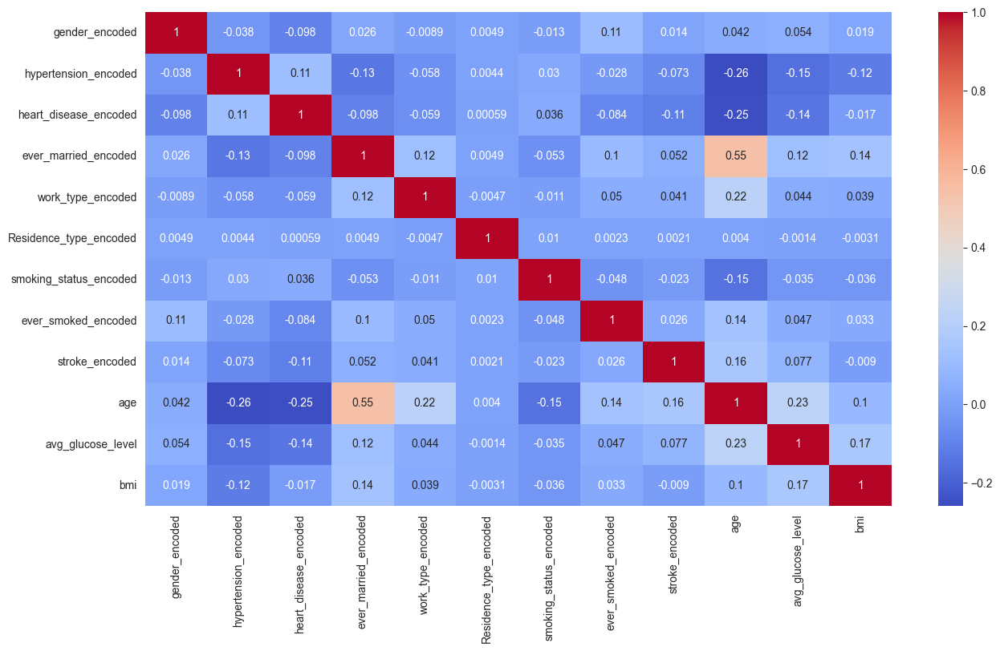

In [157]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
numeric_cols = ['age', 'avg_glucose_level', 'bmi']

# Fit and transform the training data
df_scaled = scaler.fit_transform(df[numeric_cols])
df_scaled_2 = pd.DataFrame(df_scaled, columns=numeric_cols)
#t then standardizes the data (this is the "transform" part) by subtracting the mean and dividing by the standard deviation for each column.


# Ensure consistency in scaling across the dataset
df_scaled_final = pd.concat([df.drop(['age', 'avg_glucose_level', 'bmi'], axis=1).reset_index(drop=True), df_scaled_2], axis=1)
df_scaled_final.head()

# Plotting correlation matrix
plt.figure(figsize=(15, 8))
sns.heatmap(df_scaled_final.corr(), annot=True, cmap='coolwarm')
plt.show()

### 6. Data Visualization


#### 6.1 Visualizing continuous data

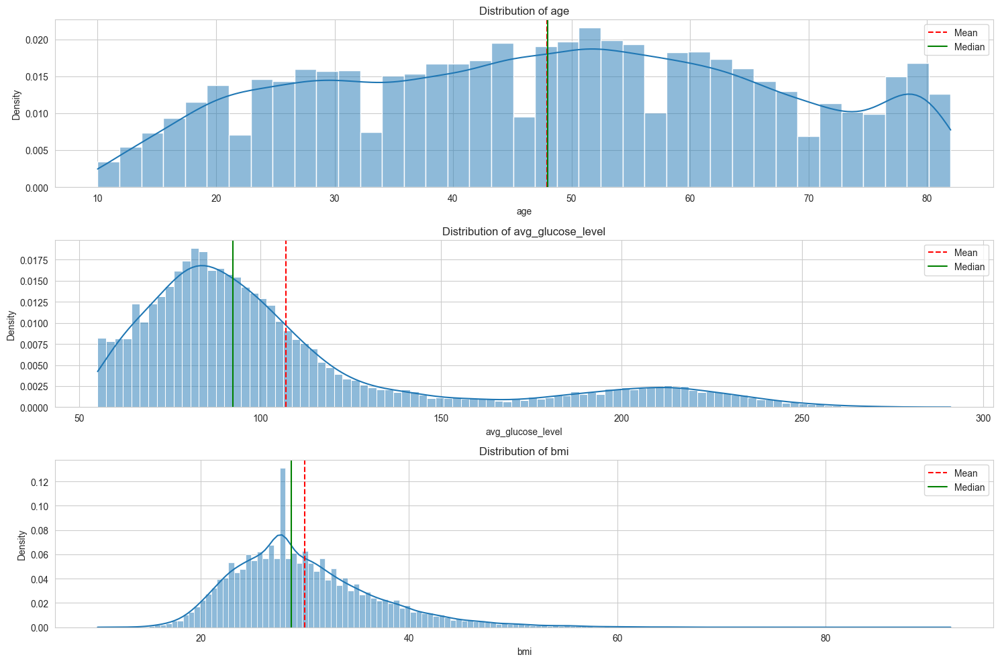

In [158]:
plt.figure(figsize=(15, 10))  # Create a new figure with a specified figure size

# Define the list of continuous columns
continous_data = ["age", "avg_glucose_level", "bmi"]

# Iterate through each continuous column
for i, column in enumerate(continous_data, 1):
    # Create a subplot for the current continuous column
    plt.subplot(len(continous_data), 1, i)

    # Create a histogram plot for the current continuous column with kernel density estimation (kde) and density statistics (stat="density")
    sns.histplot(df2[column], kde=True, stat="density")

    # Add vertical lines for the mean and median of the data
    plt.axvline(df2[column].mean(), color='r', linestyle='--', label='Mean')
    plt.axvline(df2[column].median(), color='g', linestyle='-', label='Median')

    # Add a legend to the plot
    plt.legend()

    # Set the title, x-axis label, and y-axis label for the plot
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Density")

# Adjust the layout of subplots
plt.tight_layout()

# Display the plot
plt.show()


the distribution isn't perfectly normal (bell-shaped), but the closeness of the mean and median suggests it's not highly skewed. The shape of the histogram suggests a somewhat balanced distribution with minor deviations.

This distribution is right-skewed, as indicated by the mean being higher than the median. The presence of outliers or higher values in the avg_glucose_level is pulling the mean to the right, while the median remains closer to the majority of the data.

body mass index

#### 6.2 Visualizing categorical data

C:\Users\ninic\AppData\Local\Temp\ipykernel_26644\695072792.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=column, data=df2, palette=colors)
C:\Users\ninic\AppData\Local\Temp\ipykernel_26644\695072792.py:11: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  ax = sns.countplot(x=column, data=df2, palette=colors)
C:\Users\ninic\AppData\Local\Temp\ipykernel_26644\695072792.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=column, data=df2, palette=colors)
C:\Users\ninic\AppData\Local\Temp\ipykernel_26644\695072792.py:11: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  ax 

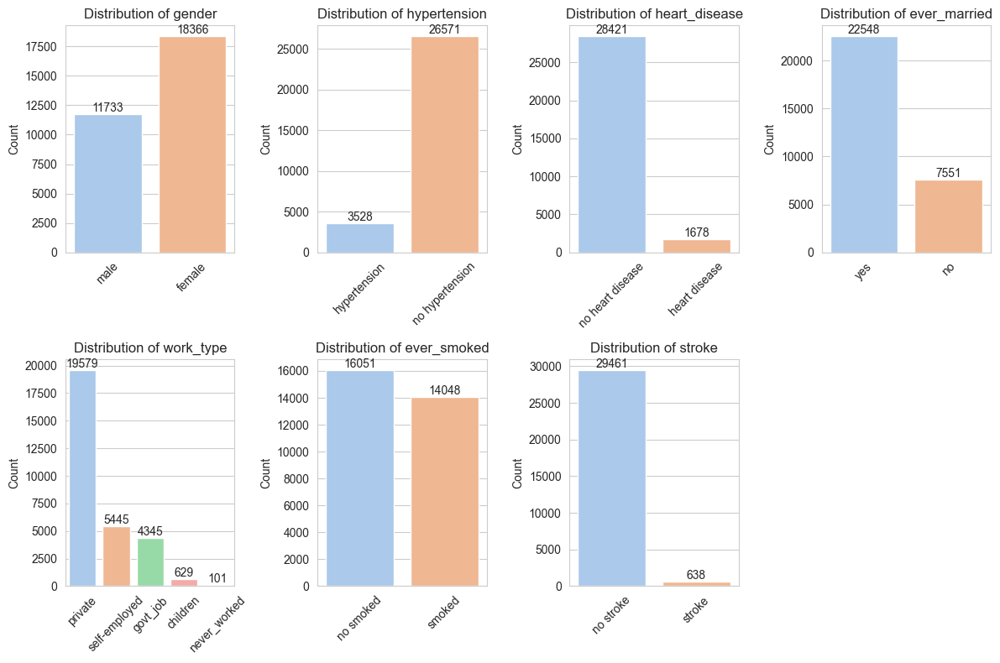

In [159]:
sns.set_style("whitegrid")
colors = sns.color_palette("pastel")
plt.figure(figsize=(12, 8))

# Define the list of categorical columns
categorical_data = ["gender", "hypertension", "heart_disease", "ever_married", "work_type", "ever_smoked", "stroke"]

# Iterate through each categorical column
for i, column in enumerate(categorical_data):
    plt.subplot(2, 4, i+1)
    ax = sns.countplot(x=column, data=df2, palette=colors)

    plt.title(f"Distribution of {column}")
    plt.xlabel("")
    plt.ylabel("Count")
    plt.xticks(rotation=45)

    # Add count values on top of each bar
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2., p.get_height(), f'{int(p.get_height())}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()

# Display the plot
plt.show()


#### 6.3 Density plot of age by stroke status

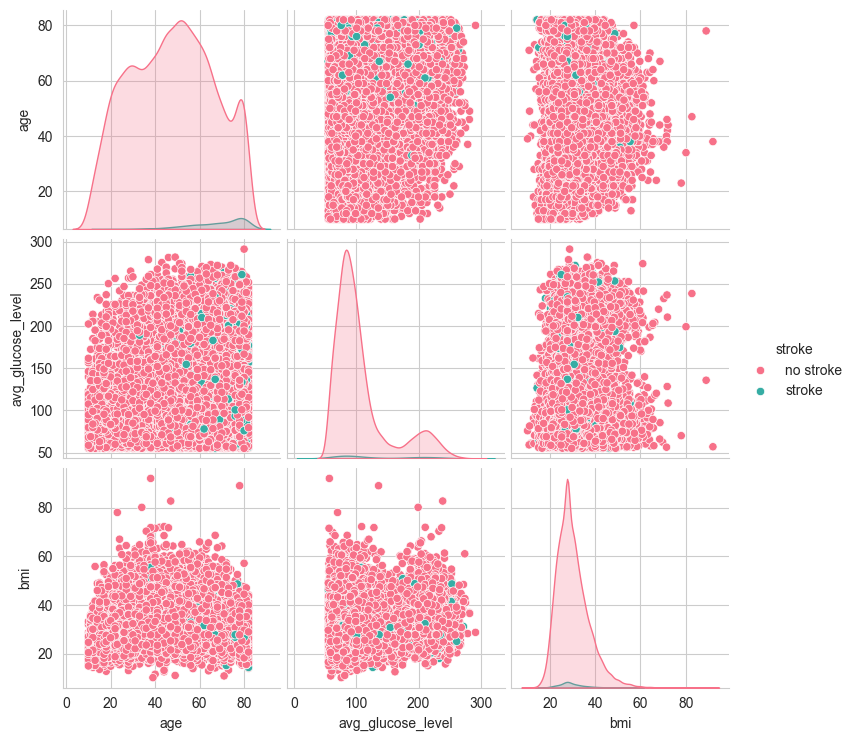

In [160]:
sns.pairplot(data=df2, hue='stroke', palette='husl')
plt.show()


The data points appear to be uniformly distributed across different age groups, with bmi values spread across a wide range for all ages.
There is no clear correlation between age and bmi, indicating that bmi does not vary significantly with age in this dataset.
Distribution plots are used to show the distribution of each individual variable on the diagonal.

#### 6.4 Density Plot of Age by Stroke Status

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


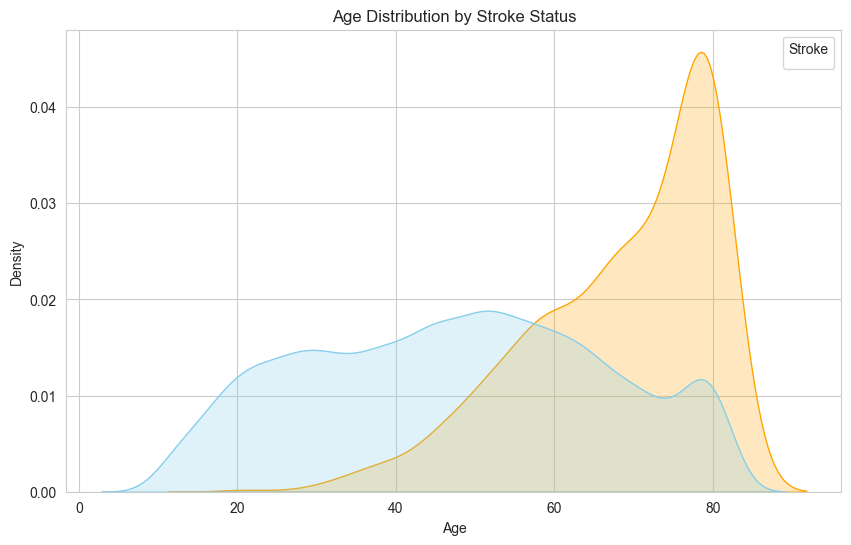

In [161]:
df_age_stroke = df2[['stroke', 'age']]

# Ensure the palette keys match the values in the 'stroke' column
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df_age_stroke, x='age', hue='stroke', fill=True, 
            palette={'stroke': 'orange', 'no stroke': 'skyblue'}, common_norm=False)
plt.title('Age Distribution by Stroke Status')
plt.xlabel('Age')
plt.ylabel('Density')
plt.legend(title='Stroke')
plt.show()

#### 6.5 Stacked Bar Plot for Smoking Status and Stroke

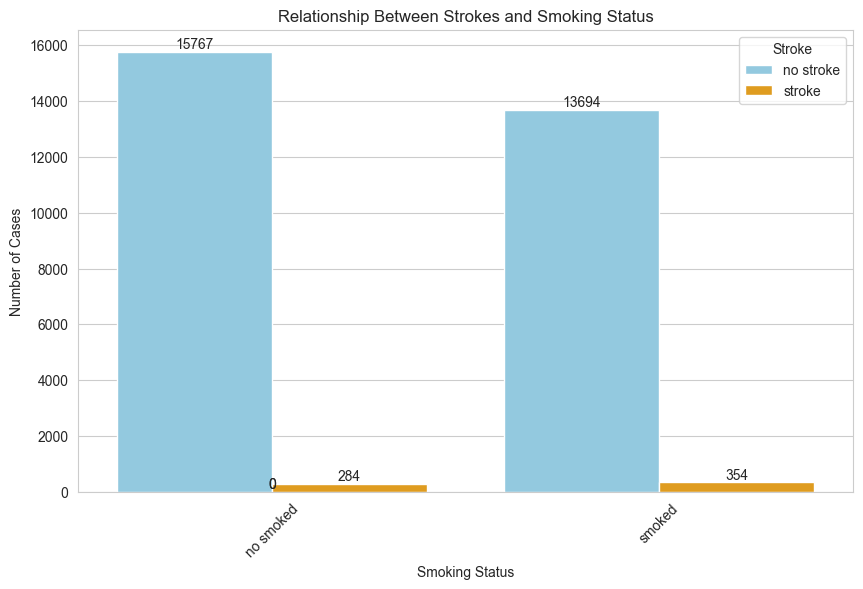

In [162]:
stroke_smoking_counts = df2.groupby(['ever_smoked', 'stroke']).size().reset_index(name='count')
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='ever_smoked', y='count', hue='stroke', data=stroke_smoking_counts, palette={'stroke': 'orange', 'no stroke': 'skyblue'})
for p in ax.patches:
    ax.text(p.get_x() + p.get_width() / 2., p.get_height(), f'{int(p.get_height())}', ha='center', va='bottom', fontsize=10)
plt.title('Relationship Between Strokes and Smoking Status')
plt.xlabel('Smoking Status')
plt.ylabel('Number of Cases')
plt.xticks(rotation=45)
plt.legend(title='Stroke')
plt.show()

#### 6.6 Violin Plot for Stroke and Average Glucose Level

C:\Users\ninic\AppData\Local\Temp\ipykernel_26644\1807086446.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='stroke', y='avg_glucose_level', data=df_avg_glucose_stroke, palette={'no stroke': 'skyblue', 'stroke': 'orange'})


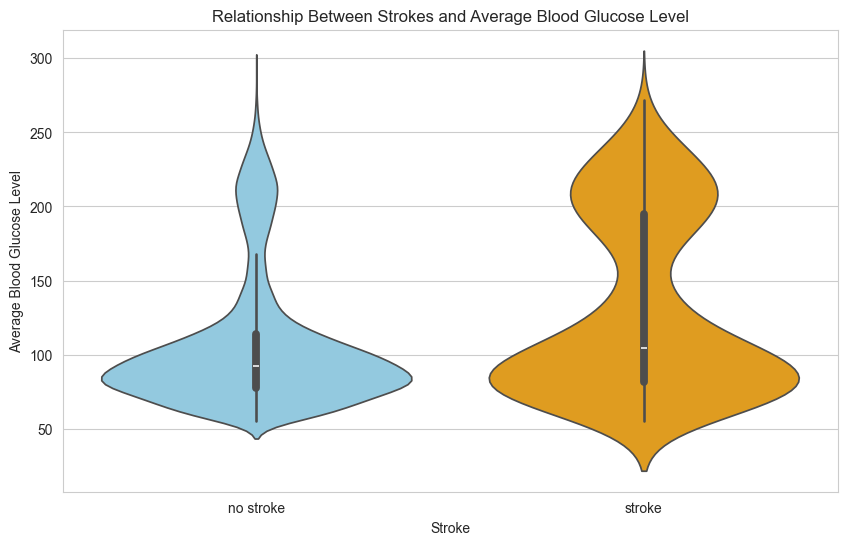

In [163]:
df_avg_glucose_stroke = df2[['stroke', 'avg_glucose_level']].reset_index(drop=True)
plt.figure(figsize=(10, 6))
sns.violinplot(x='stroke', y='avg_glucose_level', data=df_avg_glucose_stroke, palette={'no stroke': 'skyblue', 'stroke': 'orange'})
plt.title('Relationship Between Strokes and Average Blood Glucose Level')
plt.xlabel('Stroke')
plt.ylabel('Average Blood Glucose Level')
plt.show()


While the majority of the data for both groups is concentrated around similar glucose levels, the "stroke" group shows a greater spread towards higher glucose levels.
This suggests that higher blood glucose levels might be more common or have a broader range in individuals who have experienced a stroke.

### 7. Balancing the Data

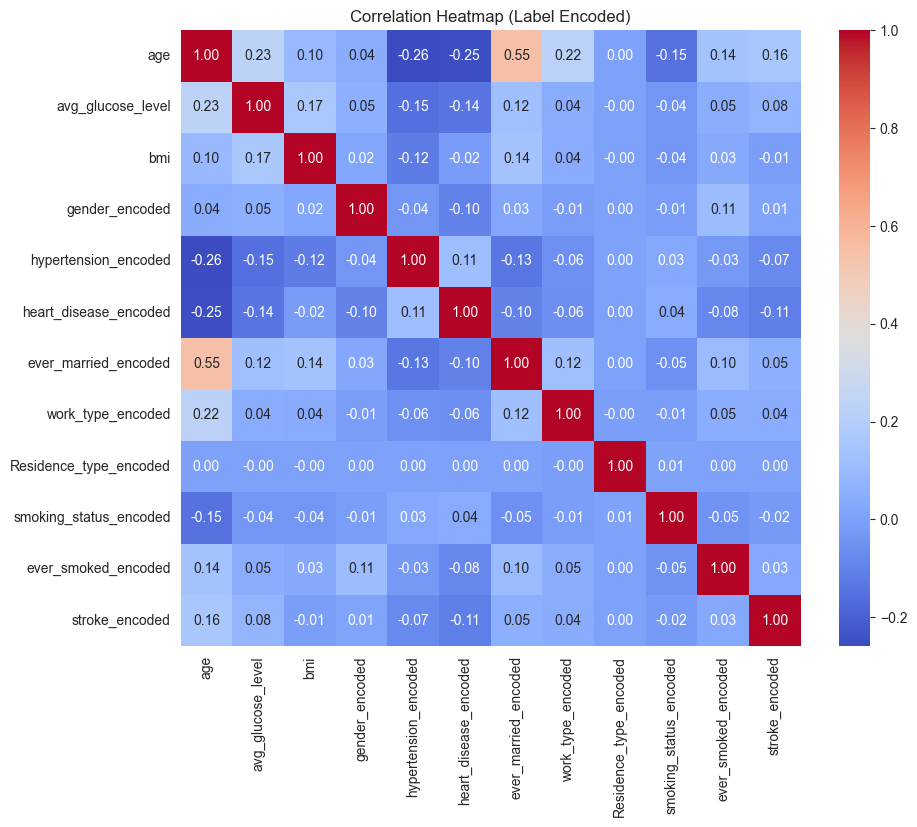

In [164]:
from sklearn.utils import resample

df_positive = df2[df2['stroke'] == 'stroke']
df_negative = df2[df2['stroke'] == 'no stroke']
n_samples = min(len(df_positive), len(df_negative))

# Subsampling negative examples to equal the number of positive examples
df_negative_resampled = resample(df_negative, replace=False, n_samples=n_samples, random_state=42)

# Merging subsampled DataFrames
df_balanced = pd.concat([df_positive, df_negative_resampled])

# Initialize the LabelEncoder
le = LabelEncoder()


columns = ["gender", "hypertension","heart_disease","ever_married","work_type","Residence_type","smoking_status","stroke","ever_smoked"]
# Apply Label Encoding to all categorical columns
for col in columns:
    df_balanced[col] = le.fit_transform(df_balanced[col])

# Generate the heatmap for the label encoded dataframe
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap (Label Encoded)")
plt.show()

It is not conclusive

### 8. Models Analysis.

In [165]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, recall_score
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
import lime.lime_tabular
import joblib


#### 8.1 Prepare the Data

In [166]:
df_scaled_allfeatures=df_balanced.copy()
df_balanced

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,ever_smoked
63,1,67.0,1,0,1,3,1,228.69,36.6,0,1,1
81,0,61.0,1,1,1,4,0,202.21,27.7,1,1,0
141,1,80.0,1,0,1,3,0,105.92,32.5,1,1,0
257,0,49.0,1,1,1,3,1,171.23,34.4,2,1,1
264,0,79.0,0,1,1,4,0,174.12,24.0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
35106,1,22.0,1,1,0,3,1,113.28,27.2,2,0,1
18233,0,54.0,1,1,1,1,0,89.73,35.3,0,0,1
19073,0,44.0,1,1,1,3,1,88.04,25.3,1,0,0
38556,0,41.0,1,1,1,3,0,114.48,47.9,0,0,1


In [167]:
# Load the dataset and separate features and target
X = df_balanced.drop(columns=['stroke'])
y = df_balanced['stroke']

# Split data in training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


#### 8.2 Train, Evaluate, and Save Models

In [168]:
# Definir una variable global para guardar los resultados
global_metrics = {}

def train_evaluate_save(model, model_name, X_train, y_train, X_test, y_test, resampler=None):
    """
    Train the model, evaluate it, and save it.
    """
    global global_metrics  # Referenciar la variable global

    # Apply resampling if provided (for imbalanced data)
    if resampler:
        X_train_resampled, y_train_resampled = resampler.fit_resample(X_train, y_train)
    else:
        X_train_resampled, y_train_resampled = X_train, y_train
    
    # Train the model
    model.fit(X_train_resampled, y_train_resampled)
    
    # Predict on test data
    y_pred = model.predict(X_test)
    
    # Evaluate model performance
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    
    print(f'\n{model_name} Performance:')
    print(f'Accuracy: {accuracy:.2f}')
    print(f'F1 Score: {f1:.2f}')
    print(f'Recall: {recall:.2f}')
    #print('Classification Report:')
    #print(classification_report(y_test, y_pred))
    print('Confusion Matrix:')
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='coolwarm', fmt='d', annot_kws={"size": 10})
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()
    
    # Save the model
    joblib.dump(model, f'{model_name}.h5')
    
    # Guardar los resultados en la variable global
    global_metrics[model_name] = {
        'accuracy': accuracy,
        'f1_score': f1,
        'recall': recall
    }

    return model

Importance: Since it's vital not to miss positive cases of stroke (i.e., people who are actually at risk), recall is a key metric. You want to ensure that the model identifies as many people at risk as possible.
Ideal Use: In a health context, it’s more dangerous to miss a stroke case (false negative) than to have a false alarm (false positive).


#### 8.3 Interpret the Model with LIME

In [169]:
def interpret_model(model, model_name, X_train, X_test):
    """
    Interpret model with LIME and SHAP.
    """
    # LIME
    explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X.columns, 
                                                       class_names=['No Stroke', 'Stroke'], discretize_continuous=True)
    exp = explainer.explain_instance(X_test.iloc[0].values, model.predict_proba)
    exp.show_in_notebook(show_table=True, show_all=False)
    exp.as_pyplot_figure()
    plt.show()
    


#### 8.4 Train, evaluate, and interpret Logistic Regression


Logistic_Regression Performance:
Accuracy: 0.77
F1 Score: 0.77
Recall: 0.77
Confusion Matrix:


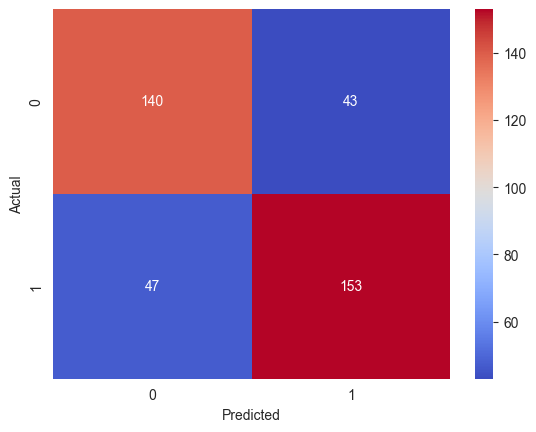

c:\Users\ninic\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


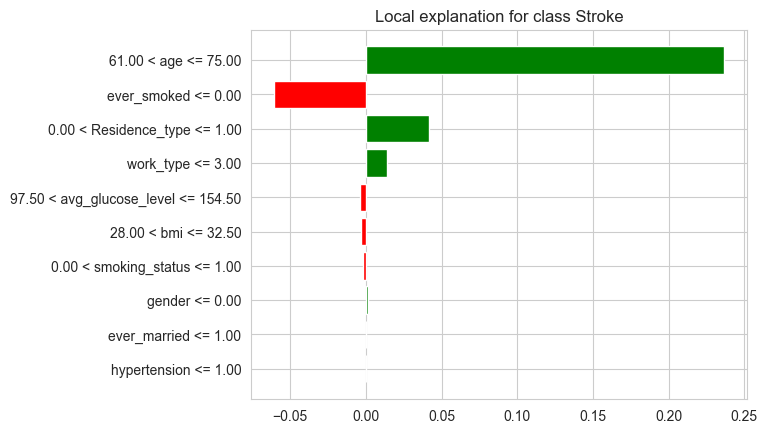

In [170]:

logistic_model = LogisticRegression(max_iter=1000, random_state=42)
under_sampler = RandomUnderSampler(random_state=42)

logistic_model = train_evaluate_save(logistic_model, 'Logistic_Regression', X_train, y_train, X_test, y_test, resampler=under_sampler)
interpret_model(logistic_model, 'Logistic_Regression', X_train, X_test)


Why Standardize? Logistic Regression combines all the input features to make a prediction. If one feature has larger values than others, it might dominate the model’s decisions. Standardizing ensures that each feature has an equal influence on the outcome.

#### 8.4.1 Train, evaluate, and interpret Logistic Regression with standardized data

       gender       age  hypertension  heart_disease  ever_married  work_type  \
63          1  0.479113             1              0             1          3   
81          0  0.160260             1              1             1          4   
141         1  1.169962             1              0             1          3   
257         0 -0.477447             1              1             1          3   
264         0  1.116820             0              1             1          4   
...       ...       ...           ...            ...           ...        ...   
35106       1 -1.912288             1              1             0          3   
18233       0 -0.211736             1              1             1          1   
19073       0 -0.743158             1              1             1          3   
38556       0 -0.902585             1              1             1          3   
37044       1 -0.318021             1              1             1          1   

       Residence_type  avg_

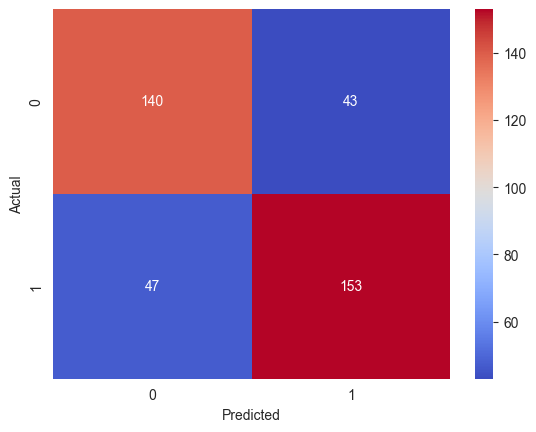

c:\Users\ninic\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


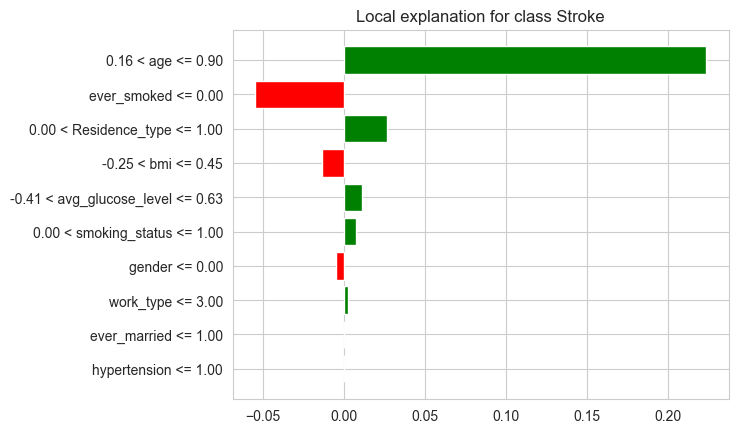

In [171]:
# Print column names and numeric columns

# Initialize the scaler
scaler = StandardScaler()

# Ensure df_scaled has the columns listed in numeric_cols
if all(col in df_scaled_allfeatures.columns for col in numeric_cols):
    # Fit and transform the data using the scaler, directly on the DataFrame
    df_scaled_allfeatures[numeric_cols] = scaler.fit_transform(df_scaled_allfeatures[numeric_cols])

    # Display the scaled dataframe
    print(df_scaled_allfeatures)
else:
    print("One or more columns in numeric_cols not found in df_scaled.")




# Load the dataset and separate features and target
X = df_scaled_allfeatures.drop(columns=['stroke'])
y = df_scaled_allfeatures['stroke']

# Split data in training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

logistic_model = LogisticRegression(max_iter=1000, random_state=42)
under_sampler = RandomUnderSampler(random_state=42)

logistic_model = train_evaluate_save(logistic_model, 'Logistic_Regression', X_train, y_train, X_test, y_test, resampler=under_sampler)
interpret_model(logistic_model, 'Logistic_Regression', X_train, X_test)



#### 8.5 Train, evaluate, and interpret Naive Bayes



Naive_Bayes Performance:
Accuracy: 0.75
F1 Score: 0.75
Recall: 0.75
Confusion Matrix:


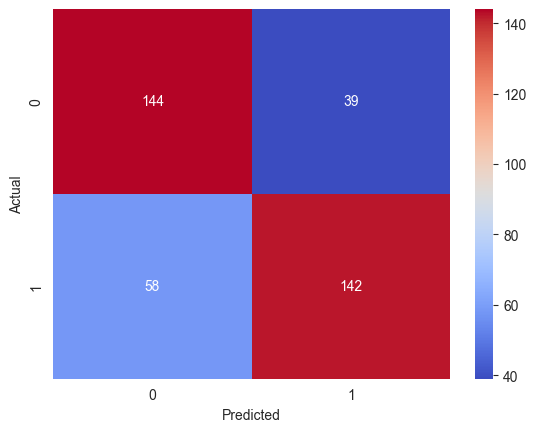

c:\Users\ninic\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


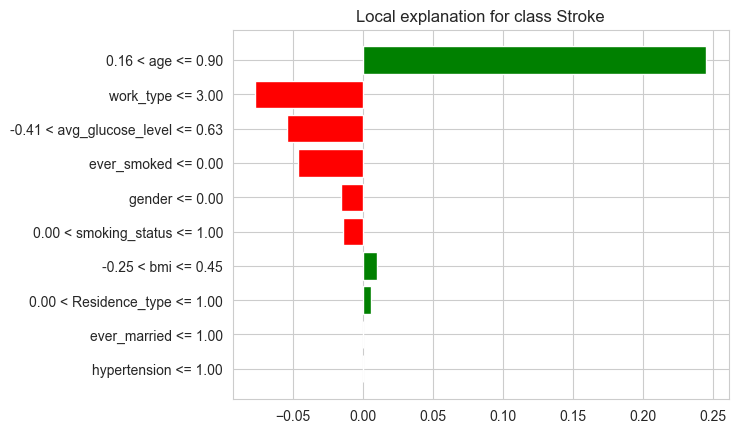

In [172]:

nb_model = GaussianNB()
over_sampler = RandomOverSampler(random_state=42)

nb_model = train_evaluate_save(nb_model, 'Naive_Bayes', X_train, y_train, X_test, y_test, resampler=over_sampler)
interpret_model(nb_model, 'Naive_Bayes', X_train, X_test)


#### 8.6 Train, evaluate, and interpret Decision Tree



Decision_Tree Performance:
Accuracy: 0.75
F1 Score: 0.75
Recall: 0.75
Confusion Matrix:


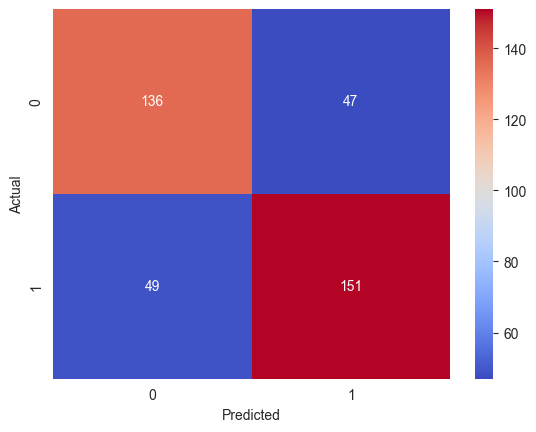

c:\Users\ninic\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


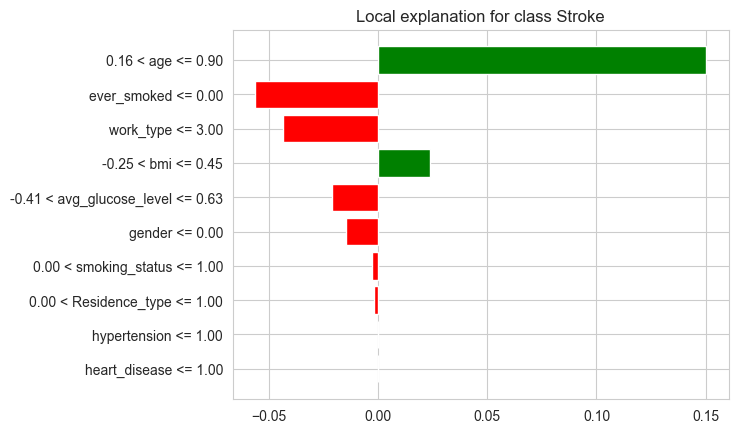

In [173]:
# Train, evaluate, and interpret Decision Tree

dt_model = DecisionTreeClassifier(random_state=42)
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 5, 10]
}
grid_search = GridSearchCV(dt_model, param_grid, cv=5, scoring='accuracy')

dt_model = train_evaluate_save(grid_search, 'Decision_Tree', X_train, y_train, X_test, y_test, resampler=under_sampler)
interpret_model(dt_model, 'Decision_Tree', X_train, X_test)


#### 8.7 Train, evaluate, and interpret Random Forest



Random_Forest Performance:
Accuracy: 0.79
F1 Score: 0.79
Recall: 0.79
Confusion Matrix:


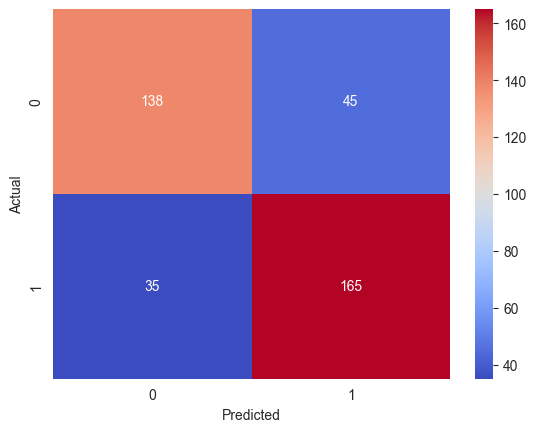

c:\Users\ninic\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


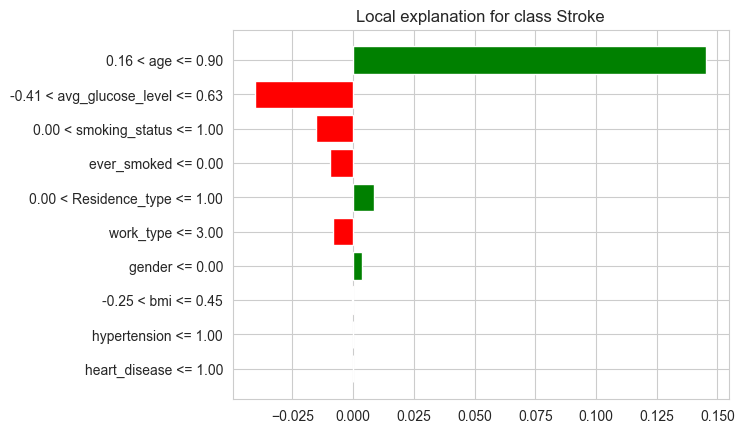

In [174]:
# Train, evaluate, and interpret Random Forest

rf_model = RandomForestClassifier(random_state=42)
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 5, 10]
}
grid_search_rf = GridSearchCV(rf_model, param_grid_rf, cv=5, scoring='accuracy')

rf_model = train_evaluate_save(grid_search_rf, 'Random_Forest', X_train, y_train, X_test, y_test, resampler=under_sampler)
interpret_model(rf_model, 'Random_Forest', X_train, X_test)


#### 8.8 Train, evaluate, and interpret Random SVC



SVC Performance:
Accuracy: 0.78
F1 Score: 0.78
Recall: 0.78
Confusion Matrix:


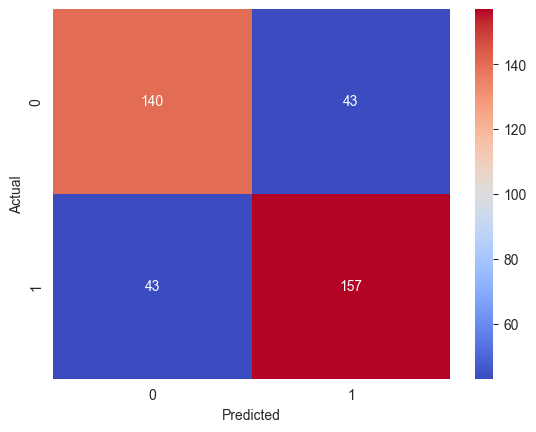

AttributeError: This 'SVC' has no attribute 'predict_proba'

In [175]:
# Train, evaluate, and interpret SVC

svc_model = SVC(kernel='linear', random_state=42)

svc_model = train_evaluate_save(svc_model, 'SVC', X_train, y_train, X_test, y_test, resampler=over_sampler)
interpret_model(svc_model, 'SVC', X_train, X_test)


In [179]:
# Convertir global_metrics a un DataFrame
metrics_df = pd.DataFrame.from_dict(global_metrics, orient='index')

# Mostrar el DataFrame
print(metrics_df)

                     accuracy  f1_score    recall
Logistic_Regression  0.765013  0.765096  0.765013
Naive_Bayes          0.746736  0.746671  0.746736
Decision_Tree        0.749347  0.749399  0.749347
Random_Forest        0.791123  0.790736  0.791123
SVC                  0.775457  0.775457  0.775457
